In [1]:
%matplotlib inline

# Elekta phantom quality control


## Origin

The `mne-python` notebook `plot_brainstorm_phantom_elekta.ipynb` was used as a starting point.

Here we compute the evoked from raw for the Brainstorm Elekta phantom
tutorial dataset. For comparison, see [1]_ and:

    http://neuroimage.usc.edu/brainstorm/Tutorials/PhantomElekta


In [2]:
# Original authors: Eric Larson <larson.eric.d@gmail.com>
# Modified by: Christopher Bailey <cjb@cfin.au.dk>
#
# License: BSD (3-clause)

import os.path as op
import numpy as np
import matplotlib.pyplot as plt

import mne
from mne import find_events, fit_dipole, pick_events
from mne.io import read_raw_fif

# from mayavi import mlab  # this redirects print to stdout, i.e. Terminal!
print(__doc__)

Automatically created module for IPython interactive environment


The data are collected with an Elekta Neuromag Triux system at 1000 Hz
and low-pass filtered at 330 Hz.

__NB__: remember to specify the peak-to-peak amplitude of the dipoles below!

In [21]:
data_path = '/Users/cjb/data/MEG_service/phantom_dipole_check'

# data_path = '/projects/MEG_service/raw/0015/20130826_000000/MEG/002.dipoles32_cHPI_ON/files'

actual_dipole_amp_nAm_pp = 200.
raw_fname = op.join(data_path, '0035-all_dipoles_hp01_200nAm_raw.fif')
raw = read_raw_fif(raw_fname)

# SSS calibration and CTC
cal = op.join(data_path, 'sss_cal_3103_171013_wtrain.dat')
ctc = op.join(data_path, 'ct_sparse.fif')

Get the events for the phantom, where each dipole (1-32) gets its own event. 

__NB__ the phantom dipole triggers end up in channel `SYS201` on Triux-systems.

In [22]:
events = find_events(raw, 'SYS201')

In [23]:
# raw.plot(events=events)
# raw.info['bads'] = []

The train causes massive low-frequency artefacts. Here we plot only out to 60 seconds to save memory:

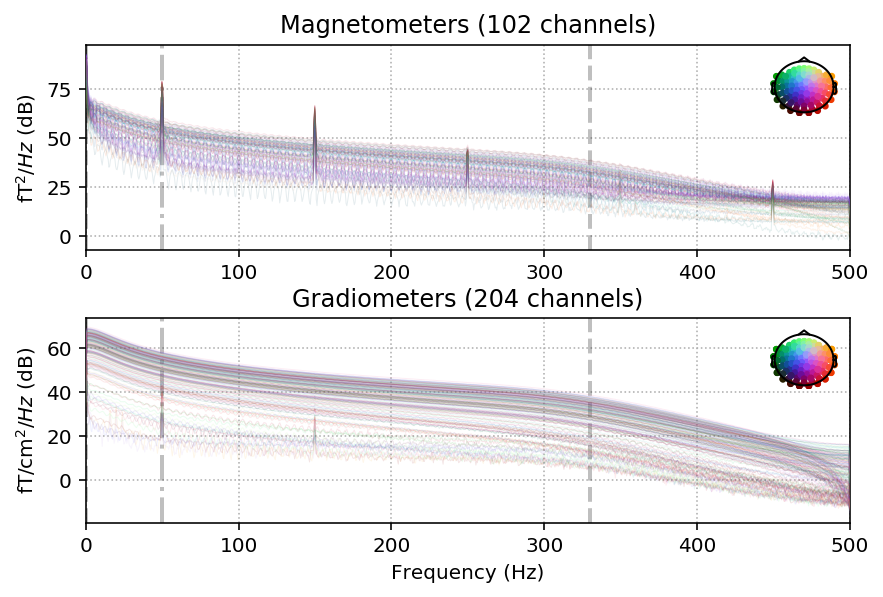

In [24]:
raw.plot_psd(tmax=60., average=False);

## Preprocessing

### Fix magnetometer coil type

Elekta DACQ marks the magnetometer coils as type 'T1' (3022), although in all modern systems, including ours, the coils are actually type 'T3' (3024). The difference is 25.8 vs. 21.0 mm side length of the square sensor sides. This influences the fine details of forward models, and certainly SSS, so we force the coils to be 3024:

In [25]:
raw.fix_mag_coil_types()

<Raw  |  0035-all_dipoles_hp01_200nAm_raw.fif, n_channels x n_times : 319 x 1010000 (1010.0 sec), ~4.4 MB, data not loaded>

### Optional: maxfilter (in `mne`) the data

Make sure the calibration and cross-talk correction files are available.

In [26]:
# raw = mne.preprocessing.maxwell_filter(raw, origin=(0., 0., 0.), calibration=cal, cross_talk=ctc)

### Time-domain filtering

We know our phantom produces sinusoidal bursts below 25 Hz, so let's low-pass the line noise out.

In [27]:
raw.load_data()
raw.filter(None, 40., fir_design='firwin')
# raw.plot(events=events)

<Raw  |  0035-all_dipoles_hp01_200nAm_raw.fif, n_channels x n_times : 319 x 1010000 (1010.0 sec), ~2.40 GB, data loaded>

### Epoching

Now we epoch our data, average it, and look at the first dipole response.
The first peak appears around 3 ms. Because we low-passed at 40 Hz,
we can also decimate our data to save memory.

__NB__ detrending may be used if lots of drifts are present (and not handled by baselining).

__NNB__ SSP projections are applied at Epoching-stage, assuming they exist (removed by SSS)

In [28]:
tmin, tmax = -0.1, 0.1
event_id = list(range(1, 33))
reject = {'mag': 4e-11}  # elevated threshold, otherwise we reject on signal!
detrend = None  # use 0 to remove DC, changes results very little
epochs = mne.Epochs(raw, events, event_id, tmin, tmax, baseline=(None, -0.01),
                    decim=3, preload=True, reject=reject)

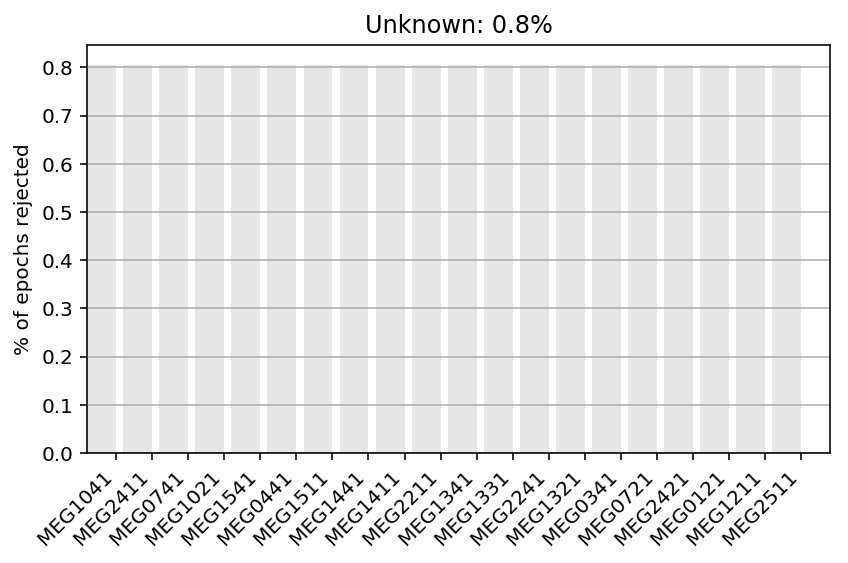

In [29]:
epochs.plot_drop_log();

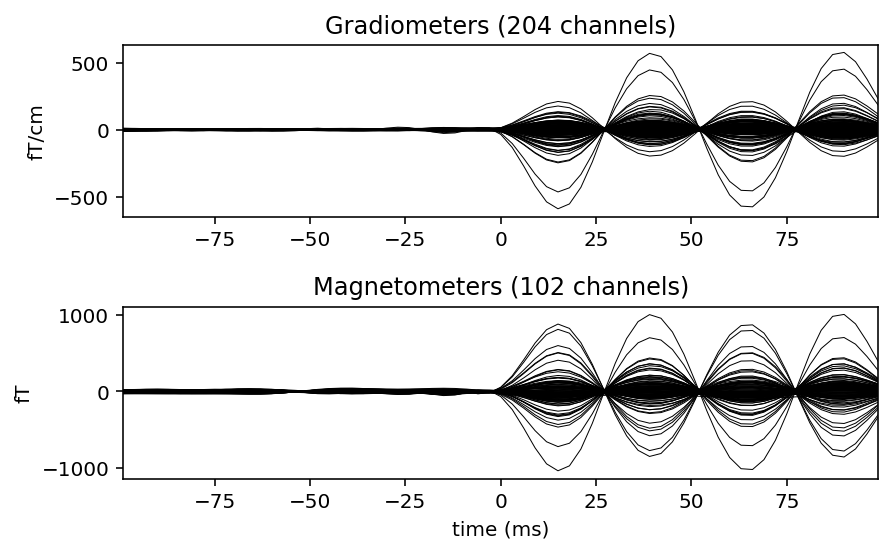

In [30]:
epochs['1'].average().plot();

## Dipole fitting

Use a sphere head geometry model, The phantom is properly modeled by
a single-shell sphere with origin (0., 0., 0.).

In [31]:
sphere = mne.make_sphere_model(r0=(0., 0., 0.), head_radius=None)

Let's do some dipole fits. We first compute the noise covariance,
then do the fits for each event_id taking the time instant that maximizes
the global field power.

__NB__ `fit_dipole` returns dipole orientations such that the amplitude is positive.

In [32]:
cov = mne.compute_covariance(epochs, tmax=0)
data = []
for ii in event_id:
    evoked = epochs[str(ii)].average().crop(0.025, 0.050)
    idx_peak = np.argmax(evoked.copy().pick_types(meg='grad').data.std(axis=0))
    t_peak = evoked.times[idx_peak]
#     print('{:d}: {:2f}'.format(ii, t_peak))
    evoked.crop(t_peak, t_peak)
    data.append(evoked.data[:, 0])
evoked = mne.EvokedArray(np.array(data).T, evoked.info, tmin=0.)

In [33]:
# del epochs, raw

In [34]:
dip = fit_dipole(evoked, cov, sphere, n_jobs=1)[0]

Now we can compare to the actual locations, taking the difference in mm:



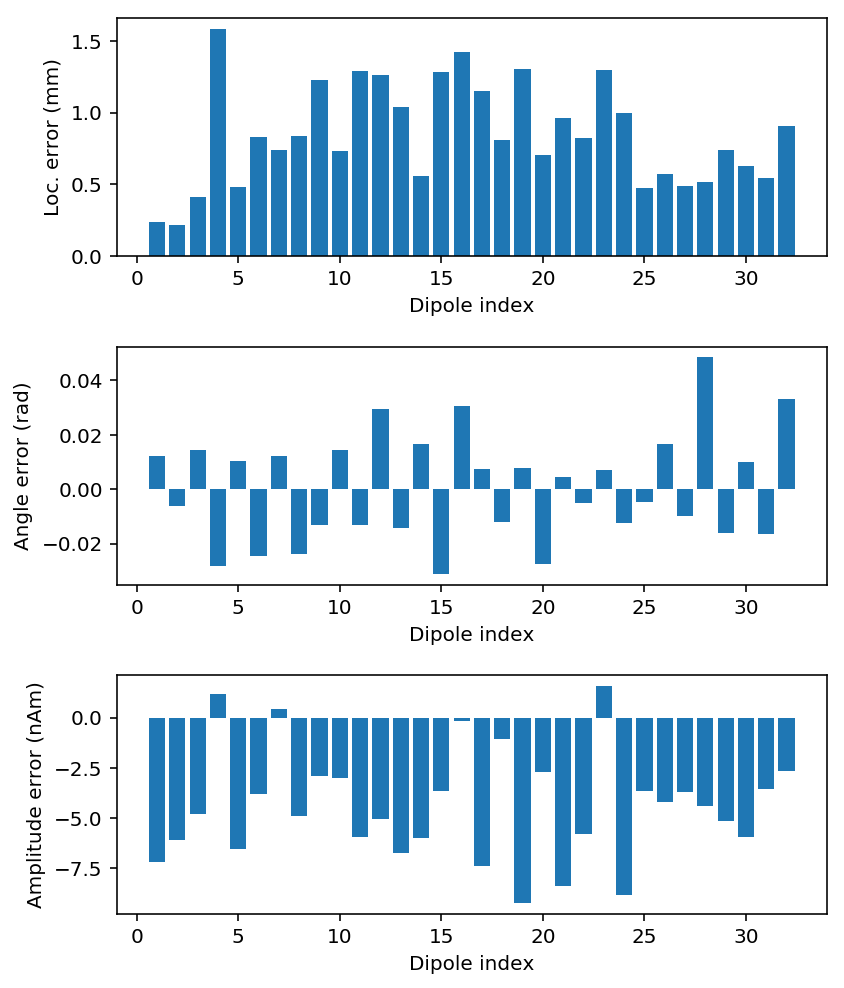

In [35]:
actual_pos, actual_ori = mne.dipole.get_phantom_dipoles()

fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, ncols=1, figsize=(6, 7))

diffs = 1000 * np.sqrt(np.sum((dip.pos - actual_pos) ** 2, axis=-1))
print('mean(position error) = %s' % (np.mean(diffs),))
ax1.bar(event_id, diffs)
ax1.set_xlabel('Dipole index')
ax1.set_ylabel('Loc. error (mm)')

# get the signed angle difference
dot_prod = np.sum(dip.ori * actual_ori, axis=1)
angles = np.sign(dot_prod) * np.arccos(np.abs(dot_prod))
print('mean(angle error) = %s' % (np.mean(angles),))
ax2.bar(event_id, angles)
ax2.set_xlabel('Dipole index')
ax2.set_ylabel('Angle error (rad)')

amps = dip.amplitude / 1e-9 - actual_dipole_amp_nAm_pp / 2. 
print('mean(abs amplitude error) = %s' % (np.mean(np.abs(amps)),))
ax3.bar(event_id, amps)
ax3.set_xlabel('Dipole index')
ax3.set_ylabel('Amplitude error (nAm)')

fig.tight_layout()
plt.show()

## 3D plots

* coordinate alignment and the sphere location. 
*  positions and the orientations of the actual and the estimated dipoles

In [36]:
%matplotlib qt

In [37]:
mne.viz.plot_alignment(raw.info, subject='sample',
                       meg='helmet', bem=sphere, dig=True,
                       surfaces=['brain'])

In [38]:
from mayavi import mlab  # this redirects print to stdout, i.e. Terminal!
def plot_pos_ori(pos, ori, color=(0., 0., 0.), signs=None):
    
    if signs is not None:
        ori = signs[:, np.newaxis] * ori
    
    mlab.points3d(pos[:, 0], pos[:, 1], pos[:, 2], scale_factor=0.005,
                  color=color)
    mlab.quiver3d(pos[:, 0], pos[:, 1], pos[:, 2],
                  ori[:, 0], ori[:, 1], ori[:, 2],
                  scale_factor=0.03,
                  color=color)

mne.viz.plot_alignment(evoked.info, bem=sphere, surfaces=[])

# Plot the position and the orientation of the actual dipole
plot_pos_ori(actual_pos, actual_ori, color=(1., 0., 0.))
# Plot the position and the orientation of the estimated dipole

# NB: pass the signs of the differences between true and estimated orientations to get the plot right!!
plot_pos_ori(dip.pos, dip.ori, color=(0., 0., 1.), signs=np.sign(dot_prod))